In [1]:
%load_ext autoreload
%autoreload 2

In [37]:
import torch
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

from typing import List, Dict
from tqdm.notebook import tqdm, trange
import pandas as pd
import numpy as np
from scipy.stats import gaussian_kde
from scipy.spatial import distance_matrix, KDTree
from scipy.cluster.hierarchy import linkage, fcluster
from scipy.spatial.distance import pdist, cosine
from sklearn.linear_model import LinearRegression
from sklearn.cross_decomposition import CCA
import csv
import os

import matplotlib.pyplot as plt
%matplotlib inline

In [3]:
from data_utils import *
from model_utils import *

In [4]:
# Load trained model, and set up various explainability utilities
model = NLPHandler("BERT_extradata.ckpt")

Some weights of the model checkpoint at bert-base-uncased were not used when initializing BertForSequenceClassification: ['cls.predictions.transform.dense.bias', 'cls.predictions.transform.LayerNorm.weight', 'cls.seq_relationship.weight', 'cls.predictions.transform.LayerNorm.bias', 'cls.predictions.transform.dense.weight', 'cls.seq_relationship.bias', 'cls.predictions.bias', 'cls.predictions.decoder.weight']
- This IS expected if you are initializing BertForSequenceClassification from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing BertForSequenceClassification from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
Some weights of BertForSequenceClassification were not initialized from the model checkpoint at

Loading trained classifier BERT_extradata.ckpt


INFO: lib level=1
INFO: root level=30
INFO: Detected pytorch backend for <class 'transformers.models.bert.modeling_bert.BertForSequenceClassification'>.
INFO: Using backend Backend.PYTORCH.
INFO: If this seems incorrect, you can force the correct backend by passing the `backend` parameter directly into your get_model_wrapper call.
DEBUG: Input dtype was not passed in. Defaulting to `torch.float32`.


# Collect Average attributions word by word for different QoI measures

In [5]:
DATA_FOLDER = f"compiled_data"
COMBINED_LABELED_DATASET_PATH = f"{DATA_FOLDER}/combined_labeled_data.csv"

ATTRIBUTION_FOLDER = f"attribution_results"
AVE_ATTR_DATASET_PATH = f"{ATTRIBUTION_FOLDER}/aggregate_attributions.csv"
EMBED_ATTR_DATASET_PATH = f"{ATTRIBUTION_FOLDER}/embedding_attributions.csv"

In [6]:
# Store computed occurrence and attribution metrics for each word, using multiple attribution methods
class WordData:
    # Fields for WordData when in dict format
    # Args:
    #   attr_names: Identifier used for each attributor method used
    @staticmethod
    def fields(attr_names: List[str], labeled=True) -> List[str]:
        word_fields = ["word", "occurrences"]
        
        if labeled:
            word_fields += [f"{label_name}.label_occurrences" for label_name in LABELS]
            word_fields += [f"{label_name}.label_frequency" for label_name in LABELS]
        
        for attr_name in attr_names:
            word_fields += [f"{attr_name}.attr_average", f"{attr_name}.attr_min", f"{attr_name}.attr_max"]
            
        return word_fields
    
    def __init__(self, word: str, attr_names: List[str], labeled=True) -> None:
        self.word = word
        self.occurrences = 0
        
        self.labeled = labeled
        if labeled:
            self.occurrences_by_label = [0 for _ in LABELS]

        self.attr_total = {name: 0 for name in attr_names}
        self.attr_min = {name: None for name in attr_names}
        self.attr_max = {name: None for name in attr_names}
        
    # Update the count for this word (required since multiple attr methods will need to be updated separately)
    # This should only be called once for each word occurrence
    def update_count(self, label_ind: int = None) -> None:
        self.occurrences += 1
        
        if self.labeled:
            self.occurrences_by_label[int(label_ind)] += 1
        
    # Update attribution metrics for this word
    # Should be called exactly once for each attr method for each word occurrence
    def update_attr(self, attr_name: str, attr_val: float) -> None:
        self.attr_total[attr_name] += attr_val
        if self.attr_min[attr_name] is None or attr_val < self.attr_min[attr_name]:
            self.attr_min[attr_name] = attr_val
        if self.attr_max[attr_name] is None or attr_val > self.attr_max[attr_name]:
            self.attr_max[attr_name] = attr_val
        
    # Aggregate metrics and return final dict format (after all updates complete)
    def dict(self):
        result = {}
        result["word"] = self.word
        result["occurrences"] = self.occurrences
        
        if self.labeled:
            for label_ind, label_name in enumerate(LABELS):
                result[f"{label_name}.label_occurrences"] = self.occurrences_by_label[label_ind]
                result[f"{label_name}.label_frequency"] = self.occurrences_by_label[label_ind] / self.occurrences
        
        for attr_name in self.attr_total.keys():
            result[f"{attr_name}.attr_average"] = self.attr_total[attr_name] / self.occurrences
            result[f"{attr_name}.attr_min"] = self.attr_min[attr_name]
            result[f"{attr_name}.attr_max"] = self.attr_max[attr_name]
            
        return result
        
        
'''
Computes occurrence metrics and attribution bounds for each word over all tweets,
saving metrics as a csv file
'''
def save_average_word_attributions(model_handler: NLPHandler, savepath, tweets, labels, attributor_dict):
    word_data = {}
    
    for i in trange(len(tweets)):
        tweet = tweets[i]
        label = labels[i]
        
        torch.cuda.empty_cache()
        model_input = model.tokenize([tweet])
        tweet_token_ids = model_input["input_ids"][0]
        tweet_tokens = [model.tokenizer.decode(token_id).replace(" ", "") for token_id in tweet_token_ids]
        
        # Update word counts and initialize data store for new words
        for word in tweet_tokens:
            if word not in word_data:
                word_data[word] = WordData(word, list(attributor_dict.keys()))
            word_data[word].update_count(label)
        
        # Attribution for each method, updating attribution metrics for each tweet word
        for attr_name, attributor in attributor_dict.items():
            torch.cuda.empty_cache()
            attribution = attributor.attributions(**model_input)
            tweet_embedding_attributions = attribution[0]
            
            for word, embedding_attribution in zip(tweet_tokens, tweet_embedding_attributions):
                attr_val = embedding_attribution.sum().item()
                word_data[word].update_attr(attr_name, attr_val)
    
    # Compile each WordData object into a fixed dict of metrics
    field_names = WordData.fields(list(attributor_dict.keys()))
    word_data = {word: data.dict() for word, data in word_data.items()} # Convert data for each word into dict form
                
    # Sort words by total occurrences
    words = list(word_data.keys())
    sorted_order = sorted(range(len(words)), key=lambda i: word_data[words[i]]["occurrences"], reverse=True)
    word_data = [word_data[words[i]] for i in sorted_order]
                
    # Save csv file
    with open(savepath, "w", newline="", encoding="utf-8") as fp:
        writer = csv.DictWriter(fp, field_names)
        writer.writeheader()
        writer.writerows(word_data)

    # Return file as DataFrame
    return pd.read_csv(savepath)

In [7]:
# Load or compute average attribution data

FORCE_AVE_ATTR_RECOMPUTE = False

if os.path.exists(AVE_ATTR_DATASET_PATH) and not FORCE_AVE_ATTR_RECOMPUTE:
    ave_attr = pd.read_csv(AVE_ATTR_DATASET_PATH)

else:
    labeled_dataset = pd.read_csv(COMBINED_LABELED_DATASET_PATH)
    tweets, labels = labeled_dataset["tweet_text"], labeled_dataset["tweet_label"]

    attributor_dict = {
        "real_IG": model.attributor(ClassQoI(REAL)),
        "fake_IG": model.attributor(ClassQoI(FAKE)),
        "fake_vs_real_IG": model.attributor(ComparativeQoI(FAKE, REAL))
    }

    ave_attr = save_average_word_attributions(model, AVE_ATTR_DATASET_PATH, tweets, labels, attributor_dict)

In [8]:
if False:
    # Compute attributions relative to embedding dimensions
    EMBED_DIMS = 768

    FORCE_EMBED_ATTR_RECOMPUTE = False

    if os.path.exists(EMBED_ATTR_DATASET_PATH) and not FORCE_EMBED_ATTR_RECOMPUTE:
        embed_attr = pd.read_csv(EMBED_ATTR_DATASET_PATH)

    else:
        # Initialize csv with column names
        with open(EMBED_ATTR_DATASET_PATH, "w", newline="", encoding="utf-8") as fp:
            writer = csv.writer(fp)
            writer.writerow(["word"] + [f"embed_{i}" for i in range(EMBED_DIMS)])
        
        labeled_dataset = pd.read_csv(COMBINED_LABELED_DATASET_PATH)
        tweets = labeled_dataset["tweet_text"]
        
        attributor = model.attributor(ComparativeQoI(FAKE, REAL))
        
        EMBED_DIMS = None
        embed_attr_rows = []
        for i, tweet in enumerate(tqdm(tweets, desc="Tweets")):
            torch.cuda.empty_cache()
            model_input = model.tokenize([tweet])
            tweet_token_ids = model_input["input_ids"][0]
            tweet_tokens = [model.tokenizer.decode(token_id).replace(" ", "") for token_id in tweet_token_ids]
            
            torch.cuda.empty_cache()
            attribution = attributor.attributions(**model_input)
            tweet_embedding_attributions = attribution[0]
            
            for word, embedding_attribution in zip(tweet_tokens, tweet_embedding_attributions):
                embed_attr_rows.append(
                    [word] + embedding_attribution.detach().cpu().tolist()
                )
                if EMBED_DIMS is None:
                    EMBED_DIMS = embedding_attribution.shape[0]
                    
            if i % 100 == 0:
                with open(EMBED_ATTR_DATASET_PATH, "a+", newline="", encoding="utf-8") as fp:
                    writer = csv.writer(fp)
                    writer.writerows(embed_attr_rows)
                embed_attr_rows = []
                
        with open(EMBED_ATTR_DATASET_PATH, "a+", newline="", encoding="utf-8") as fp:
            writer = csv.writer(fp)
            writer.writerows(embed_attr_rows)
        embed_attr_rows = []
        embed_attr = pd.read_csv(EMBED_ATTR_DATASET_PATH)

# Shapley Explainability Methods

In [9]:
import shap
import pickle

SHAP_VALUES_PATH = f"{ATTRIBUTION_FOLDER}/shap_values.pickle"

In [10]:
# Load or compute shap values for all labeled tweets
# Compute shap values in batches, with periodic saves, since it can take ~19 hours total

FORCE_SHAP_RECOMPUTE = False
SHAP_COMPUTE_BATCH_SIZE = 100           # Compute shap values for this many samples at once, saving periodically
SHAP_SAMPLE_COUNT = None                # Number of samples to compute shap values for (None indicates to compute for full dataset)


labeled_dataset = pd.read_csv(COMBINED_LABELED_DATASET_PATH)
shap_target_sample_count = SHAP_SAMPLE_COUNT or len(labeled_dataset)

if os.path.exists(SHAP_VALUES_PATH) and not FORCE_SHAP_RECOMPUTE:
    with open(SHAP_VALUES_PATH, "rb") as fp:
        shap_values = pickle.load(fp)
else:
    shap_values = None

start_sample_index = 0 if shap_values is None else len(shap_values)
if start_sample_index < shap_target_sample_count:
    explainer = model.shap_explainer()
    
    pbar = tqdm(range(start_sample_index, shap_target_sample_count, SHAP_COMPUTE_BATCH_SIZE),
                desc="Samples Computed", initial=start_sample_index, total=shap_target_sample_count)
    for current_shap_len in range(start_sample_index, shap_target_sample_count, SHAP_COMPUTE_BATCH_SIZE):
        batch = labeled_dataset["tweet_text"][current_shap_len : current_shap_len + SHAP_COMPUTE_BATCH_SIZE].tolist()
        
        shap_batch = explainer(batch, silent=True)
        
        if shap_values is None:
            shap_values = shap_batch
        else:
            shap_values = explanation_concat(shap_values, shap_batch)
        
        with open(SHAP_VALUES_PATH, "wb") as fp:
            pickle.dump(shap_values, fp)
            
        pbar.update(len(batch))

In [11]:
# Instance-Level Shap Explanations
for i in range(10):
    shap_instance = shap_values[i]
    if len(shap_instance.data) > 40:
        continue
    print(f"{i}: Label = {labeled_dataset['tweet_label'][i]}, Text = {labeled_dataset['tweet_text'][i]}")
    shap.plots.text(shap_instance)

1: Label = 0.0, Text = States reported 1121 deaths a small rise from last Tuesday. Southern states reported 640 of those deaths.


2: Label = 1.0, Text = Politically Correct Woman (Almost) Uses Pandemic as Excuse Not to Reuse Plastic Bag #coronavirus #nashville


7: Label = 1.0, Text = Obama Calls Trumps Coronavirus Response A Chaotic Disaster


8: Label = 1.0, Text = ???Clearly, the Obama administration did not leave any kind of game plan for something like this.??


In [12]:
shap_values_by_word = {}
for i in trange(len(shap_values)):
    for j, word in enumerate(shap_values.feature_names[i]):
        if word not in shap_values_by_word:
            shap_values_by_word[word] = []
            
        shap_values_by_word[word].append([shap_values.values[i][j, k] for k in range(2)])
        
for word, values in tqdm(shap_values_by_word.items()):
    shap_values_by_word[word] = np.array(values)

  0%|          | 0/21062 [00:00<?, ?it/s]

  0%|          | 0/15386 [00:00<?, ?it/s]

In [13]:
word_shap_mean = {word: np.mean(vals, axis=0) for word, vals in shap_values_by_word.items()}
word_shap_std = {word: np.std(vals, axis=0) for word, vals in shap_values_by_word.items()}

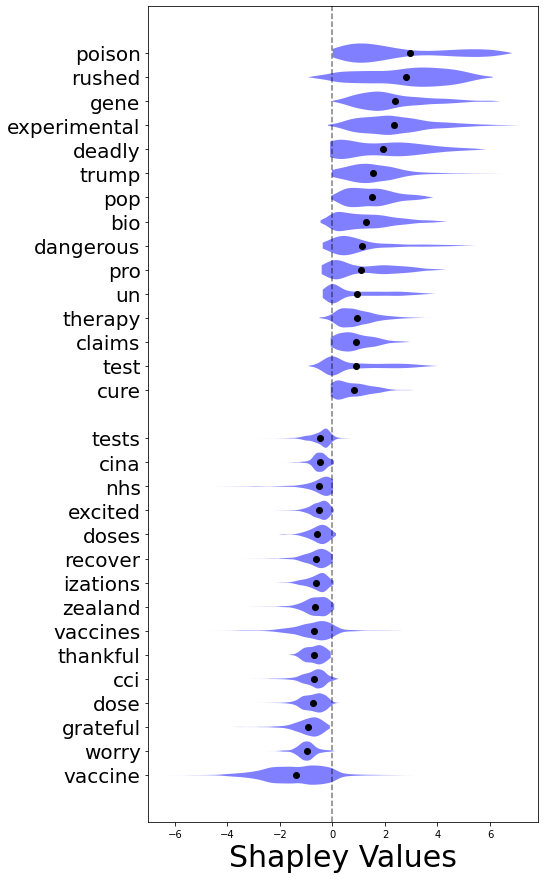

In [14]:
BEESWARM_PLOT_TOP_N = 15
MIN_OCCURRENCES = 100

filtered_words = [w for w in shap_values_by_word.keys() if len(shap_values_by_word[w]) >= MIN_OCCURRENCES]
sorted_words = sorted(filtered_words, key=lambda w: word_shap_mean[w][1], reverse=False)

y_words = sorted_words[:BEESWARM_PLOT_TOP_N] + sorted_words[-BEESWARM_PLOT_TOP_N:]
y_levels = np.concatenate([
    -1 - np.arange(BEESWARM_PLOT_TOP_N)[::-1],
    1 + np.arange(BEESWARM_PLOT_TOP_N)
])

fig, ax = plt.subplots(1, 1, figsize=(7, 1 * BEESWARM_PLOT_TOP_N))
ax.set_yticks(y_levels)
ax.set_yticklabels(y_words, fontsize=20)
ax.set_xlabel("Shapley Values", fontsize=30)

ax.axvline(0, color="k", linestyle="--", alpha=0.5)

for word, y_level in zip(y_words, y_levels):
    vals = shap_values_by_word[word][:, 1]
    ordered_vals = np.unique(vals)
    
    # Scale y_width by density around shapley values
    if len(vals) > 1:
        densities = gaussian_kde(vals)(ordered_vals)
        rescaled_densities = (densities - np.min(densities)) / (np.max(densities) - np.min(densities))
        y_width = rescaled_densities * 0.4
    else:
        y_width = 0
    
    ax.fill_between(ordered_vals, y_level + y_width, y_level - y_width, alpha=0.5, facecolor="blue")
    ax.scatter([np.mean(vals)], [y_level], c='k')

plt.savefig("shapley_beeswarm.png")
plt.show()

# BERT Embeddings Analysis

In [15]:
# Collect embeddings for vocab words

vocab = np.array(list(shap_values_by_word.keys()))
embeddings = {}
for word in tqdm(vocab):
    embeddings[word] = model.get_embeddings([word])[0]
embedding_matrix = np.array([embeddings[word] for word in vocab])

  0%|          | 0/15386 [00:00<?, ?it/s]

In [16]:
# Tool for printing words which lie near max/min bounds along chosen axis
def print_extreme_words(axis, count=20):
    # Ensure axis is normalized
    axis = axis / np.linalg.norm(axis)
    
    # Compute parallel and perpendicular components
    embedding_parallel = np.dot(embedding_matrix, axis)                             # Coordinate of each embedding along axis (scalar)
    embedding_perp = embedding_matrix - embedding_parallel[:, None] * axis[None, :] # Embeddings with axis projected out (vector)
    
    word_order = embedding_parallel.argsort()
    
    # Min bound words
    min_indices = word_order[:count]
    for i in min_indices:
        print(f"--- {vocab[i]:20}\tParallel: {embedding_parallel[i]:.4f}\tPerp: {np.linalg.norm(embedding_perp[i]):.4f}\tAttr: {word_shap_mean[vocab[i]][1]:.4f}")
    
    print("...\n...\n...")
    
    # Max bound words
    max_indices = word_order[-count:]
    for i in max_indices:
        print(f"--- {vocab[i]:20}\tParallel: {embedding_parallel[i]:.4f}\tPerp: {np.linalg.norm(embedding_perp[i]):.4f}\tAttr: {word_shap_mean[vocab[i]][1]:.4f}")

In [17]:
# Tool for plotting attribution values along some axis
def plot_attribution_along_axis(axis, xbounds=None, ybounds=None):
    # Ensure axis is normalized
    axis = axis / np.linalg.norm(axis)
    
    x = np.dot(embedding_matrix, axis)
    y = np.array([word_shap_mean[word][1] for word in vocab])
    xy = np.vstack([x, y])
    density_xy = gaussian_kde(xy)(xy)
    fig, ax = plt.subplots(1, 1, figsize=(25, 15))

    # Best fit line
    ax.plot(np.unique(x), np.poly1d(np.polyfit(x, y, 1))(np.unique(x)), "k--")

    # Scatter plot with density coloring
    s_plot = ax.scatter(x, y, s=1, c=density_xy)
    fig.colorbar(s_plot, ax=ax, label="Gaussian Kernel Density Estimate")
    
    '''
    # Moving average value
    WINDOW_LEN = 100
    sorted_x = x[x.argsort()]
    sorted_y = y[x.argsort()]
    summed_y = np.zeros_like(sorted_y)
    for i in range(WINDOW_LEN):
        summed_y += np.roll(sorted_y, i)
    average_y = summed_y[WINDOW_LEN - 1:] / WINDOW_LEN
    average_x = sorted_x[WINDOW_LEN - 1:]
    ax.plot(average_x, average_y, alpha=0.7, color="r")
    '''
    
    # Bounds
    if xbounds is None:
        xlower, xupper = ax.get_xlim()
    else:
        xlower, xupper = xbounds
    if ybounds is None:
        ylower, yupper = ax.get_ylim()
    else:
        ylower, yupper = ybounds
    
    # 1D Density plot along X
    unique_x = np.unique(x)
    density_x = gaussian_kde(x)(unique_x)
    scaled_density_x = (density_x - np.min(density_x)) / (np.max(density_x) - np.min(density_x))
    density_x_line = ylower + 0.1 * (yupper - ylower) * scaled_density_x # y-coord for 1D density line at each x
    ax.fill_between(unique_x, density_x_line, ylower, alpha=0.5, color='k')
    ax.set_ylim(ylower, yupper)
    
    # 1D Density plot along Y
    unique_y = np.unique(y)
    density_y = gaussian_kde(y)(unique_y)
    scaled_density_y = (density_y - np.min(density_y)) / (np.max(density_y) - np.min(density_y))
    density_y_line = xlower + 0.1 * (xupper - xlower) * scaled_density_y # x-coord for 1D density line at each y
    ax.fill_betweenx(unique_y, density_y_line, xlower, alpha=0.5, color='k')
    ax.set_xlim(xlower, xupper)

    ax.set_ylabel("Mean Shapley Value")
    ax.set_xlabel("Embedding Axis Projection")
    plt.show()

In [18]:
# Tool for analyzing semantic meaning of an embedding direction
def print_clusters_along_axis(data, axis):
    hierarchy = compute_cluster_hierarchy(data, axis)
    clusters = compute_flat_clusters(data, axis, hierarchy)
    print_clusters(clusters)

def compute_cluster_hierarchy(data, axis, method="complete", metric="euclidean"):
    # Ensure axis is normalized
    axis = axis / np.linalg.norm(axis)
    
    # If using builtin metric, cluster on data after projecting out axis
    if isinstance(metric, str):
        # Compute parallel and perpendicular components
        data_parallel = np.dot(data, axis)                             # Coordinate of each embedding along axis (scalar)
        data_perp = data - data_parallel[:, None] * axis[None, :] # Embeddings with axis projected out (vector)
    
        hierarchy = linkage(data_perp, method=method, metric=metric)
        return hierarchy
    
    # If using custom function, cluster on untouched data
    else:
        hierarchy = linkage(data, method=method, metric=metric)
        return hierarchy
        
        
    
def compute_flat_clusters(data, axis, hierarchy, t=0.9, criterion="inconsistent"):
    # Assign each point to a cluster, depending on hierarchy structure
    cluster_membership = fcluster(hierarchy, t=t, criterion=criterion)
    
    # Ensure axis is normalized
    axis = axis / np.linalg.norm(axis)
    
    # Compute parallel and perpendicular components
    data_parallel = np.dot(data, axis)                             # Coordinate of each embedding along axis (scalar)
    data_perp = embedding_matrix - data_parallel[:, None] * axis[None, :] # Embeddings with axis projected out (vector)
    
    # Find relevant info for each word cluster, sort each cluster by parallel coordinate
    cluster_ids = np.unique(cluster_membership)
    cluster_ids.sort()
    clusters = {}
    for id in cluster_ids:
        cluster_words = vocab[cluster_membership == id]
        
        cluster_embedding_parallel = data_parallel[cluster_membership == id]
        cluster_embedding_parallel_std = np.sqrt(np.var(cluster_embedding_parallel))
        
        cluster_embedding_perp = data_perp[cluster_membership == id]
        cluster_embedding_perp_mean = np.mean(cluster_embedding_perp, axis=0)
        cluster_embedding_perp_std = np.sqrt(np.mean(np.sum(np.square(cluster_embedding_perp - cluster_embedding_perp_mean[None, :]), axis=1), axis=0))
        
        word_sort_order = cluster_embedding_parallel.argsort()
        
        clusters[id] = {
            "words": cluster_words[word_sort_order],
            "parallel": cluster_embedding_parallel[word_sort_order],
            "std_parallel": cluster_embedding_parallel_std,
            "perp": cluster_embedding_perp[word_sort_order],
            "std_perp": cluster_embedding_perp_std
        }
        
    # sort the clusters in order of decreasing parallel bounds
    # clusters = sorted(clusters.values(), key=lambda c: np.max(c["parallel"]) - np.min(c["parallel"]), reverse=True)
    
    # Sort clusters in order of decreasing correlation to attribution values
    # clusters = sorted(clusters.values(), key=lambda c: np.abs(np.cov(np.vstack([c["parallel"], [word_shap_mean[word][1] for word in c["words"]]]))[0, 1]), reverse=True)
    
    # Sort in order of decreasing attribution range
    # clusters = sorted(clusters.values(), key=lambda c: max(word_shap_mean[w][1] for w in c["words"]) - min(word_shap_mean[w][1] for w in c["words"]), reverse=True)
    
    # Sort in order of increasing perpendicular variance
    # clusters = sorted(clusters.values(), key=lambda c: c["std_perp"])
    
    # Sort in order of decreasing attr range * parallel range
    clusters = sorted(clusters.values(), key=lambda c: (np.max(c["parallel"]) - np.min(c["parallel"]) * (max(word_shap_mean[w][1] for w in c["words"]) - min(word_shap_mean[w][1] for w in c["words"]))), reverse=True)
    
    return clusters

def print_clusters(clusters):
    for cluster in clusters:
        if (len(cluster['words']) == 1):
            continue
        if cluster["std_parallel"] == 0:
            continue
        
        contained = False
        for word in cluster["words"]:
            if all(word in other_word for other_word in cluster["words"] if other_word != word):
                contained = True
                break
        if contained:
            continue
        
        print(f"------------------------")
        print(f"Cluster Size:\t{len(cluster['words'])}")
        print(f"Parallel Std:\t{cluster['std_parallel']:.4f}")
        print(f"Perp Std:\t\t{cluster['std_perp']:.4f}")
        print(f"Words:")
        for word, parallel, perp in zip(cluster["words"], cluster["parallel"], cluster["perp"]):
            print(f"--- {word:20}\tParallel: {parallel:.4f}\tPerp: {np.linalg.norm(perp):.4f}\tAttr: {word_shap_mean[word][1]:.4f}")
        print("\n")

## Embedding Principal Components

In [19]:
# Principal Component Computation
embedding_covar = np.cov(embedding_matrix, rowvar=False)
_, principal_axis_weights, principal_embedding_axes = np.linalg.svd(embedding_covar)
embedding_principal_components = embedding_matrix @ (principal_embedding_axes.T)

In [20]:
# Find how much each principal component correlates with attributions
attr_plus_principals = []
for i, word in enumerate(vocab):
    word_embed_principal = embedding_principal_components[i]
    word_attr_plus_principal = np.concatenate(
        [
            shap_values_by_word[word][:, 1, None],
            np.broadcast_to(word_embed_principal, (len(shap_values_by_word[word]), len(word_embed_principal)))
        ],
        axis=-1
    )
    attr_plus_principals.append(word_attr_plus_principal)
attr_plus_principals = np.concatenate(attr_plus_principals, axis=0)
corr = np.corrcoef(attr_plus_principals, rowvar=False)
principal_axis_correlations = corr[0, 1:]
covar = np.cov(attr_plus_principals, rowvar=False)
principal_axis_covars = covar[0, 1:]

In [21]:
TOP_KTH_PRINCIPAL = 0

principal_axis_ind = np.abs(principal_axis_covars).argsort()[::-1][TOP_KTH_PRINCIPAL]
axis = principal_embedding_axes[principal_axis_ind]

print(f"Principal Axis {principal_axis_ind}: Attr Covar = {principal_axis_covars[principal_axis_ind]}")

# Ensure axis points in direction of positive attr correlation
if principal_axis_covars[principal_axis_ind] < 0:
    axis *= -1

Principal Axis 0: Attr Covar = -0.011328787281729905


In [22]:
#plot_attribution_along_axis(axis)

In [23]:
#hierarchy = compute_cluster_hierarchy(axis, method="average")

In [24]:
#print_clusters(compute_flat_clusters(axis, hierarchy, t=0.8, criterion="inconsistent"))

# Compute Embedding Axes Which Most Correlate with Attribution

### Embedding Axis of Covariance

Once projected out of the embedding array, there is no more covariance between any remaining embedding dimension and attributions.
(Projecting onto hyperplane for which covar . x is constant)

In [25]:
# Collect all attribution samples and their word embeddings
attr_plus_embed = []
for word in vocab:
    word_embed = embeddings[word]
    word_attr_plus_embed = np.concatenate(
        [
            shap_values_by_word[word][:, 1, None],
            np.broadcast_to(word_embed, (len(shap_values_by_word[word]), len(word_embed)))
        ],
        axis=-1
    )
    attr_plus_embed.append(word_attr_plus_embed)
attr_plus_embed = np.concatenate(attr_plus_embed, axis=0)
covar = np.cov(attr_plus_embed, rowvar=False)
axis = covar[0, 1:]
axis /= np.linalg.norm(axis)

print(f"Max embed dim covar: {np.max(covar * (1 - np.eye(covar.shape[0])))}")

print(f"Covariance: {np.cov(np.vstack([np.dot(embedding_matrix, axis), [word_shap_mean[w][1] for w in vocab]]))[0, 1]}")

Max embed dim covar: 0.11217163298558597
Covariance: -0.0014647675810911284


In [26]:
#plot_attribution_along_axis(-axis, xbounds=(-0.2, 0.8), ybounds=(-2, 2))

In [27]:
#hierarchy = compute_cluster_hierarchy(axis)

In [28]:
#print_clusters(compute_flat_clusters(axis, hierarchy, t=0.5, criterion="inconsistent"))

In [29]:
#print_extreme_words(axis, 100)

### Finding Best Correlated Axis via Canonical Correlation

In [30]:
ca = CCA(n_components=2)
ca.fit(attr_plus_embed[:, 1:], attr_plus_embed[:, :1])

axes = ca.x_rotations_.T

Correlation = -0.6500257148286418


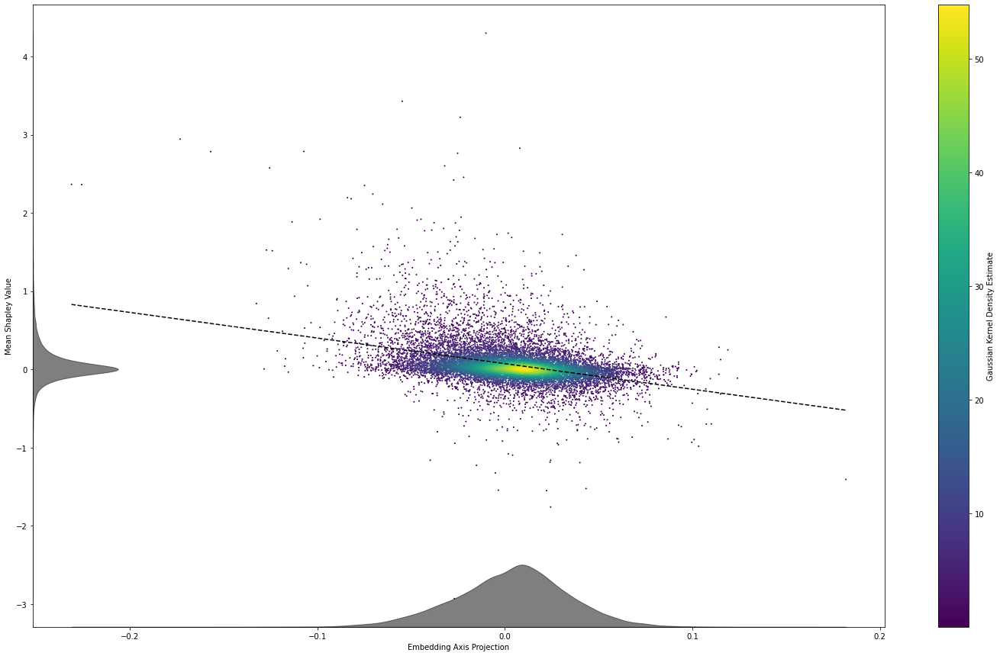

In [31]:
axis = axes[0]

print(f"Correlation = {np.corrcoef(attr_plus_embed[:,0], np.dot(attr_plus_embed[:, 1:], axis))[0, 1]}")
plot_attribution_along_axis(axis)

In [32]:
hierarchy = compute_cluster_hierarchy(embedding_matrix, axis, method="complete")

In [33]:
print_clusters(compute_flat_clusters(embedding_matrix, axis, hierarchy, t=0.6, criterion="inconsistent"))

------------------------
Cluster Size:	2
Parallel Std:	0.0481
Perp Std:		0.4485
Words:
--- rushed              	Parallel: -0.1569	Perp: 1.1596	Attr: 2.7841
--- rushing             	Parallel: -0.0607	Perp: 1.2187	Attr: 0.0459


------------------------
Cluster Size:	2
Parallel Std:	0.0623
Perp Std:		0.5683
Words:
--- tainted             	Parallel: -0.1135	Perp: 1.4326	Attr: 1.8850
--- marred              	Parallel: 0.0111	Perp: 1.4520	Attr: -0.0482


------------------------
Cluster Size:	2
Parallel Std:	0.0412
Perp Std:		0.6425
Words:
--- mccarthy            	Parallel: -0.0547	Perp: 1.2993	Attr: 3.4274
--- surreal             	Parallel: 0.0277	Perp: 1.2722	Attr: 0.0221


------------------------
Cluster Size:	2
Parallel Std:	0.0859
Perp Std:		0.8607
Words:
--- novo                	Parallel: -0.0708	Perp: 1.7208	Attr: 0.1151
--- mri                 	Parallel: 0.1009	Perp: 1.7241	Attr: -0.8967


------------------------
Cluster Size:	2
Parallel Std:	0.0575
Perp Std:		0.6021
Words:
--- po

In [34]:
print_extreme_words(axis)

--- gene                	Parallel: -0.2311	Perp: 1.2265	Attr: 2.3657
--- experimental        	Parallel: -0.2256	Perp: 1.1502	Attr: 2.3615
--- poison              	Parallel: -0.1732	Perp: 1.2462	Attr: 2.9437
--- rushed              	Parallel: -0.1569	Perp: 1.1596	Attr: 2.7841
--- poisoned            	Parallel: -0.1324	Perp: 1.4042	Attr: 0.8423
--- embryo              	Parallel: -0.1284	Perp: 1.4122	Attr: 0.0053
--- trump               	Parallel: -0.1271	Perp: 1.3830	Attr: 1.5260
--- sabotage            	Parallel: -0.1260	Perp: 1.4361	Attr: 0.6542
--- toxic               	Parallel: -0.1254	Perp: 1.2654	Attr: 2.5747
--- pop                 	Parallel: -0.1240	Perp: 1.1268	Attr: 1.5164
--- arson               	Parallel: -0.1213	Perp: 1.4305	Attr: 0.2354
--- miguel              	Parallel: -0.1186	Perp: 1.2514	Attr: 0.4875
--- worm                	Parallel: -0.1174	Perp: 1.3777	Attr: 0.0406
--- ursula              	Parallel: -0.1170	Perp: 1.4591	Attr: 0.1354
--- biotic              	Parallel:

In [127]:
hierarchy_1 = compute_cluster_hierarchy(embedding_matrix, axis, method="complete", metric=lambda u, v: np.sqrt(np.sum(np.square(u - v)) - 2 * np.square(np.dot((u - v), axis))))

In [140]:
print_clusters(compute_flat_clusters(embedding_matrix, axis, hierarchy_1, t=0.5, criterion="inconsistent"))

------------------------
Cluster Size:	2
Parallel Std:	0.0481
Perp Std:		0.4485
Words:
--- rushed              	Parallel: -0.1569	Perp: 1.1596	Attr: 2.7841
--- rushing             	Parallel: -0.0607	Perp: 1.2187	Attr: 0.0459


------------------------
Cluster Size:	2
Parallel Std:	0.0623
Perp Std:		0.5683
Words:
--- tainted             	Parallel: -0.1135	Perp: 1.4326	Attr: 1.8850
--- marred              	Parallel: 0.0111	Perp: 1.4520	Attr: -0.0482


------------------------
Cluster Size:	2
Parallel Std:	0.0412
Perp Std:		0.6425
Words:
--- mccarthy            	Parallel: -0.0547	Perp: 1.2993	Attr: 3.4274
--- surreal             	Parallel: 0.0277	Perp: 1.2722	Attr: 0.0221


------------------------
Cluster Size:	2
Parallel Std:	0.0859
Perp Std:		0.8607
Words:
--- novo                	Parallel: -0.0708	Perp: 1.7208	Attr: 0.1151
--- mri                 	Parallel: 0.1009	Perp: 1.7241	Attr: -0.8967


------------------------
Cluster Size:	2
Parallel Std:	0.0575
Perp Std:		0.6021
Words:
--- po

In [135]:
AXIS_MULTIPLIER = 10
hierarchy_2 = compute_cluster_hierarchy(
    embedding_matrix, axis, method="complete",
    metric=lambda u, v: np.sqrt(np.maximum(0, np.sum(np.square(u - v)) - (1 + AXIS_MULTIPLIER) * np.square(np.dot(u - v, axis))))
)

In [141]:
print_clusters(compute_flat_clusters(embedding_matrix, axis, hierarchy_2, t=0.5, criterion="inconsistent"))

------------------------
Cluster Size:	2
Parallel Std:	0.2065
Perp Std:		0.6691
Words:
--- gene                	Parallel: -0.2311	Perp: 1.2265	Attr: 2.3657
--- vaccine             	Parallel: 0.1819	Perp: 1.3824	Attr: -1.4073


------------------------
Cluster Size:	2
Parallel Std:	0.1563
Perp Std:		0.6134
Words:
--- experimental        	Parallel: -0.2256	Perp: 1.1502	Attr: 2.3615
--- adjustments         	Parallel: 0.0870	Perp: 1.3822	Attr: -0.8893


------------------------
Cluster Size:	2
Parallel Std:	0.1134
Perp Std:		0.6152
Words:
--- poison              	Parallel: -0.1732	Perp: 1.2462	Attr: 2.9437
--- delicious           	Parallel: 0.0536	Perp: 1.1792	Attr: -0.0742


------------------------
Cluster Size:	2
Parallel Std:	0.0481
Perp Std:		0.4485
Words:
--- rushed              	Parallel: -0.1569	Perp: 1.1596	Attr: 2.7841
--- rushing             	Parallel: -0.0607	Perp: 1.2187	Attr: 0.0459


------------------------
Cluster Size:	2
Parallel Std:	0.0623
Perp Std:		0.5683
Words:
--- t

In [35]:
hierarchy_3 = compute_cluster_hierarchy(embedding_matrix, axis, method="complete", metric="cosine")

In [36]:
print_clusters(compute_flat_clusters(embedding_matrix, axis, hierarchy_3, t=0.8, criterion="inconsistent"))

------------------------
Cluster Size:	5
Parallel Std:	0.0510
Perp Std:		0.7258
Words:
--- rushed              	Parallel: -0.1569	Perp: 1.1596	Attr: 2.7841
--- rush                	Parallel: -0.0632	Perp: 1.2116	Attr: 0.0530
--- rushing             	Parallel: -0.0607	Perp: 1.2187	Attr: 0.0459
--- rushes              	Parallel: -0.0452	Perp: 1.4503	Attr: 0.0168
--- hurry               	Parallel: -0.0004	Perp: 1.3200	Attr: 0.0290


------------------------
Cluster Size:	4
Parallel Std:	0.0406
Perp Std:		0.6564
Words:
--- toxic               	Parallel: -0.1254	Perp: 1.2654	Attr: 2.5747
--- poisonous           	Parallel: -0.0560	Perp: 1.4030	Attr: 1.2418
--- toxicity            	Parallel: -0.0341	Perp: 1.4076	Attr: -0.0051
--- toxin               	Parallel: -0.0198	Perp: 1.3976	Attr: 0.6911


------------------------
Cluster Size:	2
Parallel Std:	0.0358
Perp Std:		0.6209
Words:
--- bollywood           	Parallel: -0.0817	Perp: 1.3511	Attr: 0.5049
--- kapoor              	Parallel: -0.0101	P

In [31]:
hierarchy_4 = compute_cluster_hierarchy(
    embedding_matrix, axis, method="complete",
    metric=lambda u, v: np.nan_to_num(np.sqrt(np.sum(np.square(u - v)) / np.square(np.dot(u - v, axis)) - 1))
)

In [34]:
np.save("hierarchy_4.npy", hierarchy_4)

In [32]:
print_clusters(compute_flat_clusters(embedding_matrix, axis, hierarchy_4, t=0.7, criterion="inconsistent"))

------------------------
Cluster Size:	2
Parallel Std:	0.2065
Perp Std:		0.6691
Words:
--- gene                	Parallel: -0.2311	Perp: 1.2265	Attr: 2.3657
--- vaccine             	Parallel: 0.1819	Perp: 1.3824	Attr: -1.4073


------------------------
Cluster Size:	2
Parallel Std:	0.1383
Perp Std:		0.6598
Words:
--- poison              	Parallel: -0.1732	Perp: 1.2462	Attr: 2.9437
--- worry               	Parallel: 0.1033	Perp: 1.1447	Attr: -0.9831


------------------------
Cluster Size:	2
Parallel Std:	0.1748
Perp Std:		0.6831
Words:
--- experimental        	Parallel: -0.2256	Perp: 1.1502	Attr: 2.3615
--- coverage            	Parallel: 0.1241	Perp: 1.2016	Attr: -0.1122


------------------------
Cluster Size:	2
Parallel Std:	0.1320
Perp Std:		0.6429
Words:
--- rushed              	Parallel: -0.1569	Perp: 1.1596	Attr: 2.7841
--- relieved            	Parallel: 0.1072	Perp: 1.2864	Attr: -0.2499


------------------------
Cluster Size:	2
Parallel Std:	0.1165
Perp Std:		0.6578
Words:
--- t

In [38]:
hierarchy_5 = compute_cluster_hierarchy(embedding_matrix, axis, method="complete", metric=lambda u, v: cosine(u - v, axis))

In [39]:
print_clusters(compute_flat_clusters(embedding_matrix, axis, hierarchy_5, t=0.7, criterion="inconsistent"))

------------------------
Cluster Size:	2
Parallel Std:	0.2065
Perp Std:		0.6691
Words:
--- gene                	Parallel: -0.2311	Perp: 1.2265	Attr: 2.3657
--- vaccine             	Parallel: 0.1819	Perp: 1.3824	Attr: -1.4073


------------------------
Cluster Size:	2
Parallel Std:	0.1383
Perp Std:		0.6598
Words:
--- poison              	Parallel: -0.1732	Perp: 1.2462	Attr: 2.9437
--- worry               	Parallel: 0.1033	Perp: 1.1447	Attr: -0.9831


------------------------
Cluster Size:	2
Parallel Std:	0.1748
Perp Std:		0.6831
Words:
--- experimental        	Parallel: -0.2256	Perp: 1.1502	Attr: 2.3615
--- coverage            	Parallel: 0.1241	Perp: 1.2016	Attr: -0.1122


------------------------
Cluster Size:	2
Parallel Std:	0.1220
Perp Std:		0.6044
Words:
--- rushed              	Parallel: -0.1569	Perp: 1.1596	Attr: 2.7841
--- traveled            	Parallel: 0.0872	Perp: 1.1767	Attr: -0.1365


------------------------
Cluster Size:	2
Parallel Std:	0.1098
Perp Std:		0.6656
Words:
--- t

# Clustering Including Attribution Values

In [25]:
ATTRIBUTION_COEFFICIENT = 3
data = np.concatenate([
    ATTRIBUTION_COEFFICIENT * np.array([word_shap_mean[word][1] for word in vocab])[:, None],
    embedding_matrix
], axis=1)

hierarchy = linkage(data, method="complete")

In [96]:
cluster_membership = fcluster(hierarchy, 0.8, criterion="inconsistent")
cluster_ids = np.unique(cluster_membership)
clustered_words = []
for id in cluster_ids:
    clustered_words.append(vocab[cluster_membership == id])
clustered_words = sorted(clustered_words, key=lambda c: np.abs(np.mean([word_shap_mean[w][1] for w in c])), reverse=True)
for cluster in clustered_words:
    print(f"\n------------------")
    print(f"Cluster Size: {len(cluster)}")
    print(f"Average Attr: {np.mean([word_shap_mean[w][1] for w in cluster]):.4f}")
    for word in cluster:
        print(f"{word:20}\t{word_shap_mean[word][1]:.4f}")


------------------
Cluster Size: 3
Average Attr: 1.7354
kapoor              	4.2984
jammu               	0.5929
kashmir             	0.3149

------------------
Cluster Size: 2
Average Attr: 1.7247
mccarthy            	3.4274
surreal             	0.0221

------------------
Cluster Size: 1
Average Attr: 1.6860
octopus             	1.6860

------------------
Cluster Size: 2
Average Attr: 1.6042
footballer          	3.2222
cricketer           	-0.0139

------------------
Cluster Size: 1
Average Attr: 1.4925
cartel              	1.4925

------------------
Cluster Size: 3
Average Attr: 1.4720
poison              	2.9437
poisoned            	0.8423
poisoning           	0.6299

------------------
Cluster Size: 2
Average Attr: 1.4676
killer              	2.7866
killers             	0.1486

------------------
Cluster Size: 2
Average Attr: 1.4665
trump               	1.5260
putin               	1.4069

------------------
Cluster Size: 4
Average Attr: 1.4508
illegal             	0.9348
illegally 

In [64]:
N = 20
x = np.random.uniform(-1, 1, size=N)
y = np.random.uniform(-1, 1, size=N)

3
1
2
1
2
1
1
3
1
3
1
1


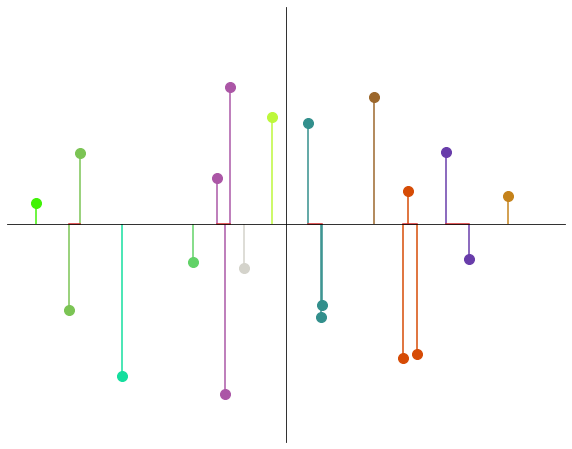

In [95]:
fig, ax = plt.subplots(1, 1, figsize=(10, 8))

cluster_membership = fcluster(linkage(x[:, None], method="complete"), t=0.1, criterion="distance")
for id in np.unique(cluster_membership):
    print(np.sum(cluster_membership == id))
    markerline, stemlines, _ = ax.stem(x[cluster_membership == id], y[cluster_membership == id])
    color=(np.random.rand(), np.random.rand(), np.random.rand())
    plt.setp(markerline, "color", color)
    plt.setp(markerline, "markersize", 10)
    plt.setp(stemlines, "color", color)


ax.set_xticks([])
ax.set_yticks([])
ax.spines['top'].set_color('none')
ax.spines['right'].set_color('none')
ax.spines['bottom'].set_position(('data', 0))
ax.spines['left'].set_position(('data', 0))

ax.set_xlim(-1.1, 1.1)
ax.set_ylim(-1.1, 1.1)
plt.show()